# Visualing Spotify data from 1922-2021

## About the data source

This particular spotify dataset is taken from [Kaggle source](https://www.kaggle.com/ektanegi/spotifydata-19212020). This file contains roughly 169k rows on on information for different songs ranging from 1921-2020. According to the source, there is a set of "top 100" songs for each year in the dataset.

The dataset consists of 19 features that describe things like tempo, liveness, loudness, etc. for any given song. For this project, we will be performing some initial exploratory data analysis followed by a cluster analysis. The goal is to see whether we can extract any information about how these songs end up being clustered. For example, could our potential clusters be based on popularity? Maybe genre? Can we observe any underlying patterns that are not obvious?


## Exploring the Data

We can start by gaining insight on how music has changed over the year regarding questions such as:
- How has tempo choice changed?
- How has valence changed?
- What is the ratio of voice to instrumental sounds in the song? (What percentage of the song is backed by vocals?)
- Have certain variables affected others as music "modernized"?

**EDA**

In [ ]:
import pandas as pd
# import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import os

In [ ]:
import sklearn
from scipy import stats
import matplotlib.pyplot as plt
import os
import seaborn as sns

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
music = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/spotify.csv') #arefa

> - Valence refers to the "positiveness" conveyed by a track. The higher the valence, the more "cheerful" sounding.
> - Acousticness refers to how acoustic a song sounds. Higher value = more acoustic.
> - Danceability refers to how danceable a song is.
> - Duration is in milliseconds
> - Energy refers to the intensity of a song (loudness, fastness, noisiness).
> - Instrumentalness is the amount of vocals in a track. High value = more instrumental.
> - Liveness represents the presence of audience ina song. A value > .8 means the song is probably live.
> - Loudness is used for volume normalization in spotify.
> - Popularity is the ranking (0-100) of songs per year.
> - Speechiness is the spoken word in a track. Value > 0.66 is made of spoken words more than likely, 0.33-0.66 may be both music and words, < 0.33 means no speech in the song.
> - Tempo is a given. Strangely, many songs contain tempos including decimals.

In [ ]:
music.head(5)

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year
0,0.995,['Carl Woitschach'],0.708,158648,0.1950,0,6KbQ3uYMLKb5jDxLF7wYDD,0.563,10,0.1510,-12.428,1,Singende Bataillone 1. Teil,0,1928,0.0506,118.469,0.7790,1928
1,0.994,"['Robert Schumann', 'Vladimir Horowitz']",0.379,282133,0.0135,0,6KuQTIu1KoTTkLXKrwlLPV,0.901,8,0.0763,-28.454,1,"Fantasiestücke, Op. 111: Più tosto lento",0,1928,0.0462,83.972,0.0767,1928
2,0.604,['Seweryn Goszczyński'],0.749,104300,0.2200,0,6L63VW0PibdM1HDSBoqnoM,0.000,5,0.1190,-19.924,0,Chapter 1.18 - Zamek kaniowski,0,1928,0.9290,107.177,0.8800,1928
3,0.995,['Francisco Canaro'],0.781,180760,0.1300,0,6M94FkXd15sOAOQYRnWPN8,0.887,1,0.1110,-14.734,0,Bebamos Juntos - Instrumental (Remasterizado),0,1928-09-25,0.0926,108.003,0.7200,1928
4,0.990,"['Frédéric Chopin', 'Vladimir Horowitz']",0.210,687733,0.2040,0,6N6tiFZ9vLTSOIxkj8qKrd,0.908,11,0.0980,-16.829,1,"Polonaise-Fantaisie in A-Flat Major, Op. 61",1,1928,0.0424,62.149,0.0693,1928


In [ ]:
music.tail(5)

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year
169904,0.1730,"['DripReport', 'Tyga']",0.875,163800,0.443,1,4KppkflX7I3vJQk7urOJaS,0.000032,1,0.0891,-7.461,1,Skechers (feat. Tyga) - Remix,75,2020-05-15,0.1430,100.012,0.306,2020
169905,0.0167,"['Leon Bridges', 'Terrace Martin']",0.719,167468,0.385,0,1ehhGlTvjtHo2e4xJFB0SZ,0.031300,8,0.1110,-10.907,1,Sweeter (feat. Terrace Martin),64,2020-06-08,0.0403,128.000,0.270,2020
169906,0.5380,"['Kygo', 'Oh Wonder']",0.514,180700,0.539,0,52eycxprLhK3lPcRLbQiVk,0.002330,7,0.1080,-9.332,1,How Would I Know,70,2020-05-29,0.1050,123.700,0.153,2020
169907,0.0714,"['Cash Cash', 'Andy Grammer']",0.646,167308,0.761,0,3wYOGJYD31sLRmBgCvWxa4,0.000000,1,0.2220,-2.557,1,I Found You,70,2020-02-28,0.0385,129.916,0.472,2020
169908,0.1090,['Ingrid Andress'],0.512,214787,0.428,0,60RFlt48hm0l4Fu0JoccOl,0.000000,0,0.1050,-7.387,1,More Hearts Than Mine,65,2020-03-27,0.0271,80.588,0.366,2020


In [ ]:
music.shape

(169909, 19)

In [ ]:
music.columns

Index(['acousticness', 'artists', 'danceability', 'duration_ms', 'energy',
       'explicit', 'id', 'instrumentalness', 'key', 'liveness', 'loudness',
       'mode', 'name', 'popularity', 'release_date', 'speechiness', 'tempo',
       'valence', 'year'],
      dtype='object')

In [ ]:
categorical_features = [features for features in music if music[features].dtypes=='O']
categorical_features

['artists', 'id', 'name', 'release_date']

No. of values of each variable in Categorical features. 

In [ ]:
for features in music[categorical_features]:
    print(features ,len(music[features].value_counts()))

artists 33375
id 169909
name 132940
release_date 10882


In [ ]:
continuous_features = [features for features in music if music[features].dtypes==('float64')]
continuous_features

['acousticness',
 'danceability',
 'energy',
 'instrumentalness',
 'liveness',
 'loudness',
 'speechiness',
 'tempo',
 'valence']

In [ ]:
discrete_features = [features for features in music if music[features].dtypes==('int64')]
discrete_features

['duration_ms', 'explicit', 'key', 'mode', 'popularity', 'year']

 No. of values of each variable in Discrete features. 

In [ ]:
for features in music[discrete_features]:
    print(features ,len(music[features].value_counts()))

duration_ms 50212
explicit 2
key 12
mode 2
popularity 100
year 100


In [ ]:
music[music['name']=='Adore You']

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year
87868,0.0237,['Harry Styles'],0.676,207133,0.771,0,3jjujdWJ72nww5eGnfs2E7,0.000007,8,0.102,-3.675,1,Adore You,88,2019-12-13,0.0483,99.048,0.569,2019
87883,0.0237,['Harry Styles'],0.676,207133,0.771,0,1M4qEo4HE3PRaCOM7EXNJq,0.000007,8,0.102,-3.675,1,Adore You,86,2019-12-06,0.0483,99.048,0.569,2019
97046,0.1110,['Miley Cyrus'],0.583,278747,0.655,0,5AnCLGg35ziFOloEnXK4uu,0.000004,0,0.113,-5.407,1,Adore You,70,2013-10-04,0.0315,119.759,0.201,2013


In [ ]:
music.drop_duplicates(subset=['artists','name'],inplace = True)

In [ ]:
music[music['name']=='Adore You']

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year
87868,0.0237,['Harry Styles'],0.676,207133,0.771,0,3jjujdWJ72nww5eGnfs2E7,0.000007,8,0.102,-3.675,1,Adore You,88,2019-12-13,0.0483,99.048,0.569,2019
97046,0.1110,['Miley Cyrus'],0.583,278747,0.655,0,5AnCLGg35ziFOloEnXK4uu,0.000004,0,0.113,-5.407,1,Adore You,70,2013-10-04,0.0315,119.759,0.201,2013


In [ ]:
music.shape


(156608, 19)

In [ ]:
music.isna().sum()

acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
explicit            0
id                  0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
name                0
popularity          0
release_date        0
speechiness         0
tempo               0
valence             0
year                0
dtype: int64

In [ ]:
music.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 156608 entries, 0 to 169907
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   acousticness      156608 non-null  float64
 1   artists           156608 non-null  object 
 2   danceability      156608 non-null  float64
 3   duration_ms       156608 non-null  int64  
 4   energy            156608 non-null  float64
 5   explicit          156608 non-null  int64  
 6   id                156608 non-null  object 
 7   instrumentalness  156608 non-null  float64
 8   key               156608 non-null  int64  
 9   liveness          156608 non-null  float64
 10  loudness          156608 non-null  float64
 11  mode              156608 non-null  int64  
 12  name              156608 non-null  object 
 13  popularity        156608 non-null  int64  
 14  release_date      156608 non-null  object 
 15  speechiness       156608 non-null  float64
 16  tempo             15

> There does not appear to be an issue with the datatypes of the columns, nor does there appear to be any missing values

In [ ]:
music.describe().T

,count,mean,std,min,25%,50%,75%,max
acousticness,156608.0,0.495783,0.376842,0.0,0.09570,0.499000,0.890000,0.996
danceability,156608.0,0.537458,0.175659,0.0,0.41600,0.547000,0.667000,0.988
duration_ms,156608.0,231046.298312,122155.309093,5991.0,170640.00000,208040.500000,262533.000000,5403500.000
energy,156608.0,0.487088,0.267400,0.0,0.26200,0.478000,0.708000,1.000
explicit,156608.0,0.086905,0.281697,0.0,0.00000,0.000000,0.000000,1.000
instrumentalness,156608.0,0.163163,0.309991,0.0,0.00000,0.000214,0.092125,1.000
key,156608.0,5.200967,3.515506,0.0,2.00000,5.000000,8.000000,11.000
liveness,156608.0,0.207698,0.177673,0.0,0.09870,0.136000,0.264000,1.000
loudness,156608.0,-11.393035,5.665935,-60.0,-14.51400,-10.499000,-7.132750,3.855
mode,156608.0,0.707505,0.454910,0.0,0.00000,1.000000,1.000000,1.000


In [ ]:
music['artists'].nunique()

33375

There are around 33375 different artist

In [ ]:
music.groupby('artists').mean().loc["['Phil Regan']"][['valence', 'acousticness', 'liveness', 'danceability', 'energy']]

valence         0.220000
acousticness    0.955333
liveness        0.195000
danceability    0.332333
energy          0.218000
Name: ['Phil Regan'], dtype: float64

> The data does not have any missing values as this was taken using Spotify's API.

Creating a categorical decade column for the purpose of EDA

In [ ]:
year_list = sorted(list(music['year'].unique()))
res = pd.cut(music['year'],10,labels=['1921-31','1931-41','1941-51','1951-61','1961-71','1971-81','1981-91','1991-01','2001-11','2011-2020'])
music['decade'] = res 
music.head(2)

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year,decade
0,0.995,['Carl Woitschach'],0.708,158648,0.1950,0,6KbQ3uYMLKb5jDxLF7wYDD,0.563,10,0.1510,-12.428,1,Singende Bataillone 1. Teil,0,1928,0.0506,118.469,0.7790,1928,1921-31
1,0.994,"['Robert Schumann', 'Vladimir Horowitz']",0.379,282133,0.0135,0,6KuQTIu1KoTTkLXKrwlLPV,0.901,8,0.0763,-28.454,1,"Fantasiestücke, Op. 111: Più tosto lento",0,1928,0.0462,83.972,0.0767,1928,1921-31


In [ ]:
music.to_csv('clean_data_spotify.csv',index=False)

Let us check distribution of songs throughout the year i.e how many songs come from various years

In [ ]:
import plotly.express as px
print(music['decade'].value_counts())
count = dict(music['decade'].value_counts())
fig = px.pie(values=list(count.values()), names=list(count.keys())) 
fig.show()

1951-61      18710
2011-2020    18522
1961-71      18518
1991-01      18370
1981-91      18290
2001-11      18184
1971-81      18033
1941-51      13795
1931-41       8466
1921-31       5720
Name: decade, dtype: int64


We can see that we have a fair distribution of data from all decades except for the decades 1921-31 and 1931-41. we have less songs from theses decades in the data

**Univariate Analysis**

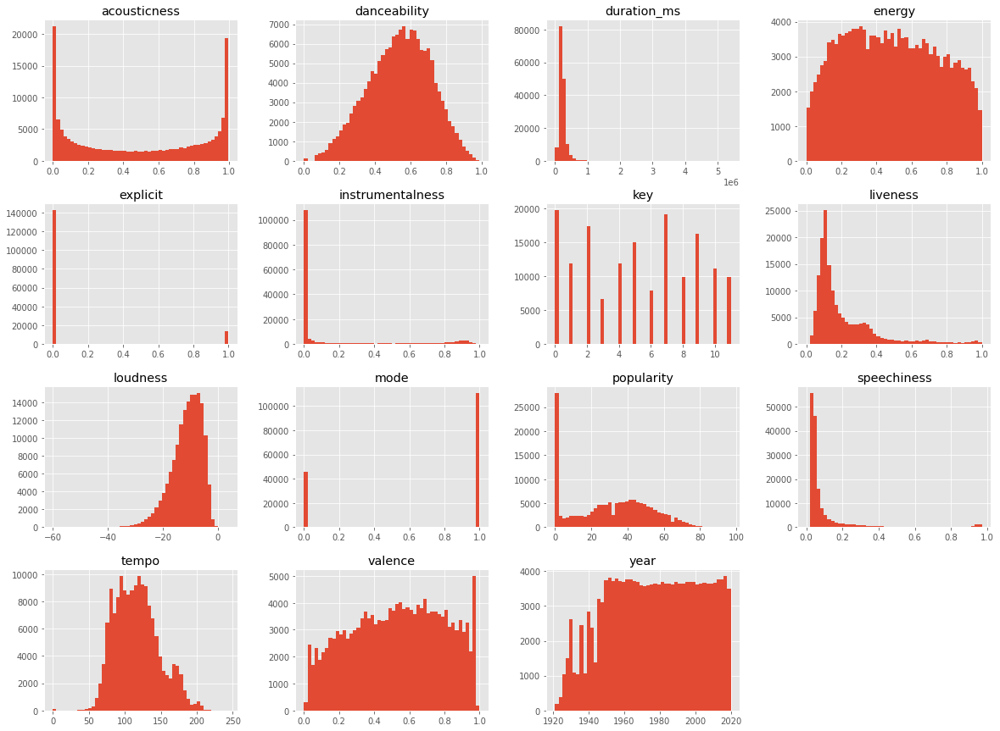

In [ ]:
with plt.style.context('ggplot'):
    music.hist(bins=50, figsize=(20, 15))
    plt.show()

> The year distribution appeared to be left skewed slightly, which seems reasonable given that data from old songs is hard to capture mean while, in real-time, artists are now constantly uploading music to Spotify.

> The data is imbalanced in terms of explicit vs non-explicit as well as the mode.

> There are several other skews in our distribution but there are also what appear to be outliers in instrumentalness and speechiness.

Mode: Major(1) / Minor(0)

In [ ]:
print(music['mode'].value_counts())
count =dict(music['mode'].value_counts())
fig = px.pie(values=list(count.values()), names=list(count.keys())) 
fig.show()

1    110801
0     45807
Name: mode, dtype: int64


Most of the songs have mode : major (1)

Explicit content(1) or 'no explicit content'(0)

In [ ]:
print(music['explicit'].value_counts())
count =dict(music['explicit'].value_counts())
fig = px.pie(values=list(count.values()), names=list(count.keys())) 
fig.show()

0    142998
1     13610
Name: explicit, dtype: int64


Most of the songs are not explicit

Majority of the songs do not have Explicit Content

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



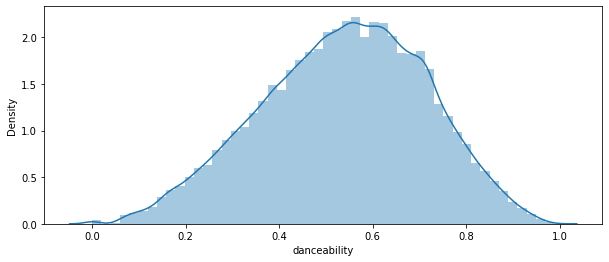

In [ ]:
plt.figure(figsize=(10,4))
sns.distplot(music['danceability'])
plt.show()

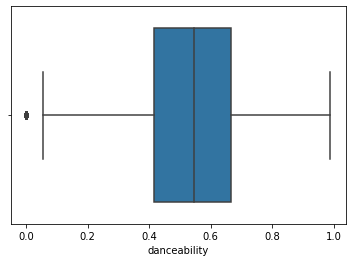

In [ ]:
sns.boxplot(data = music , x = 'danceability')
plt.show()

Maximum Danceability of songs ranges from 0.4 to 0.7

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



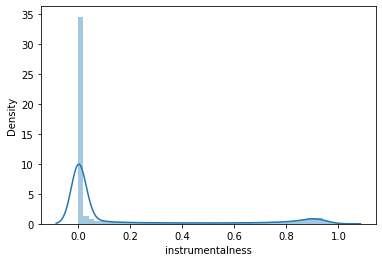

In [ ]:
sns.distplot(music['instrumentalness'])
plt.show()

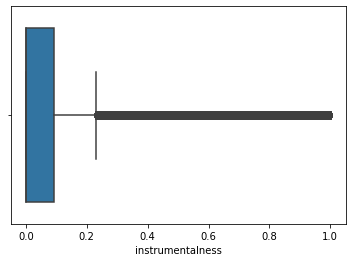

In [ ]:
sns.boxplot(data = music , x = 'instrumentalness')
plt.show()

This Dataset comprises of songs which have more of spoken words. Instrumental Songs are not present

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



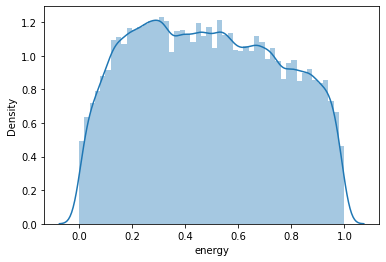

In [ ]:
sns.distplot(music['energy'])
plt.show()

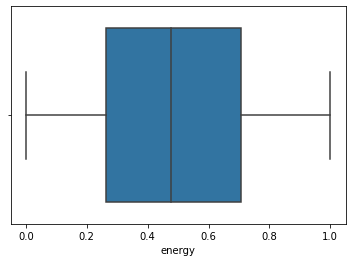

In [ ]:
sns.boxplot(data = music , x = 'energy')
plt.show()

We have all types of energy songs present in the Dataset but maximum number of songs ranging from 0.2 to 0.7

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



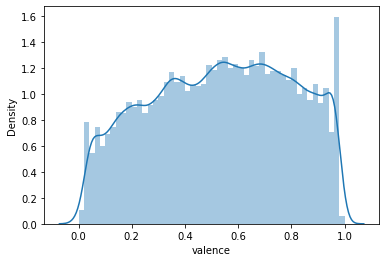

In [ ]:
sns.distplot(music['valence'])
plt.show()

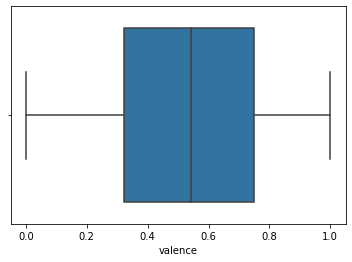

In [ ]:
sns.boxplot(data = music , x = 'valence')
plt.show()

On an average there is high positivity in songs provided in Dataset

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



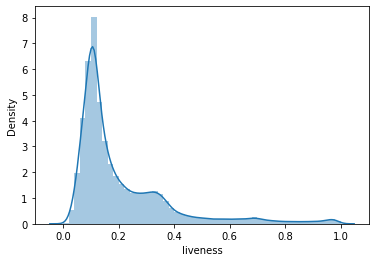

In [ ]:
sns.distplot(music['liveness'])
plt.show()

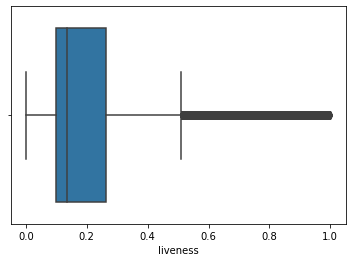

In [ ]:
sns.boxplot(data = music , x = 'liveness')
plt.show()

Majority of the tracks in the Dataset are not performed Live. It means they are recorded in studio

**Bivariate Analysis**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



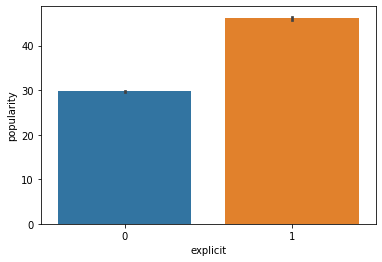

In [ ]:
sns.barplot(music['explicit'],music['popularity'])
plt.show()

Popularity of Explicit Songs is more than non-explicit

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



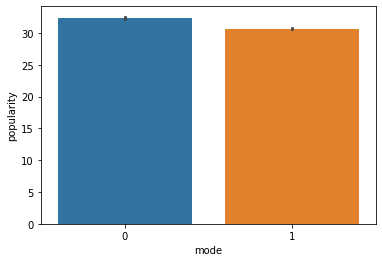

In [ ]:
sns.barplot(music['mode'],music['popularity'])
plt.show()

Popularity for both the mode is almost similar

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



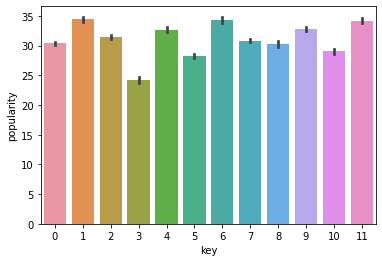

In [ ]:
sns.barplot(music['key'],music['popularity'])
plt.show()

All the Keys have almost similar contribution to the popularity

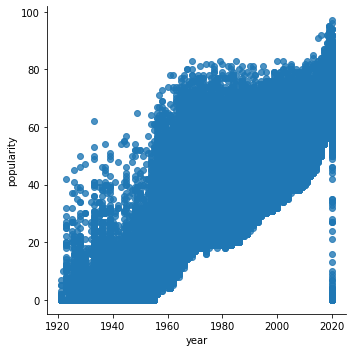

In [ ]:
sns.lmplot(data = music , x = 'year',y = 'popularity',fit_reg = False)
plt.show()

We can see that popularity of the songs increases every year

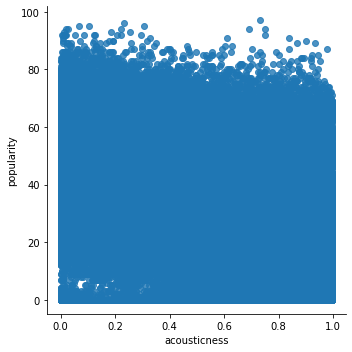

In [ ]:
sns.lmplot(data = music , x = 'acousticness',y = 'popularity',fit_reg = False)
plt.show()

Slight Downward in popularity if acousticness increases

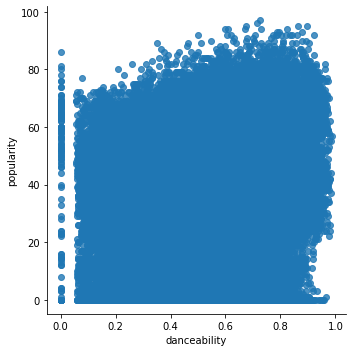

In [ ]:
sns.lmplot(data = music , x ='danceability',y = 'popularity',fit_reg = False)
plt.show()

More the danceability od songs tends to increase in popularity

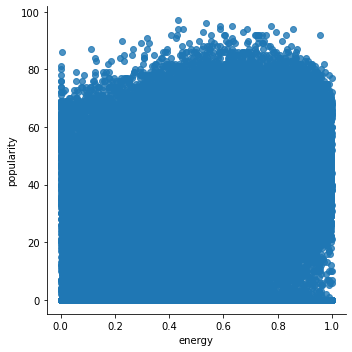

In [ ]:
sns.lmplot(data = music , x ='energy',y = 'popularity',fit_reg = False)
plt.show()

Energy does not play any role as all songs have similar popularity

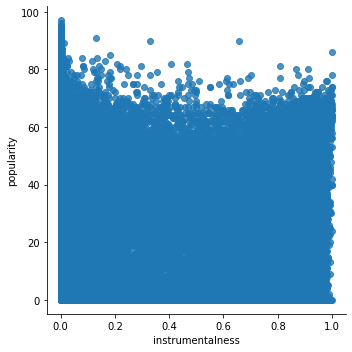

In [ ]:
sns.lmplot(data = music , x ='instrumentalness',y = 'popularity',fit_reg = False)
plt.show()

Instrumentalness is not much prefered by user accoring to the Dataset

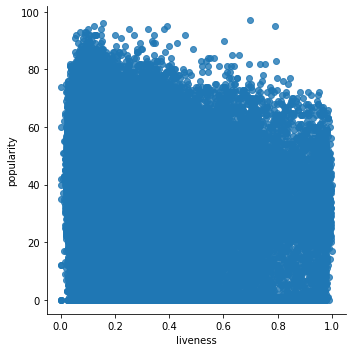

In [ ]:
sns.lmplot(data = music , x ='liveness',y = 'popularity',fit_reg = False)
plt.show()

Liveness of the songs decreases if performed live. Only hit songs are generally performed live

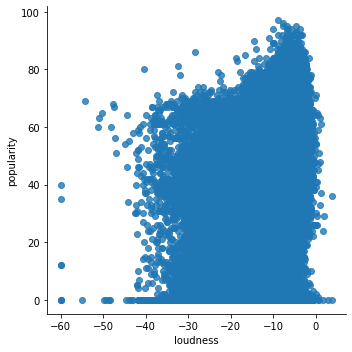

In [ ]:
sns.lmplot(data = music , x ='loudness',y = 'popularity',fit_reg = False)
plt.show()

Loudness of the song is preferred by user as no one like songs with less loudness

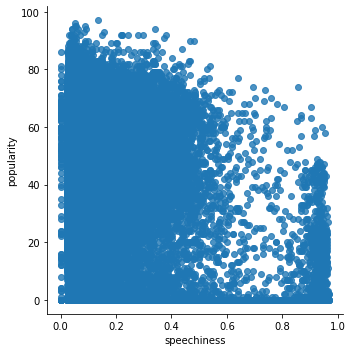

In [ ]:
sns.lmplot(data = music , x ='speechiness',y = 'popularity',fit_reg = False)
plt.show()

Songs with high spech or more soken words songs tend to loss there popularity

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 <a list of 10 Text major ticklabel objects>)

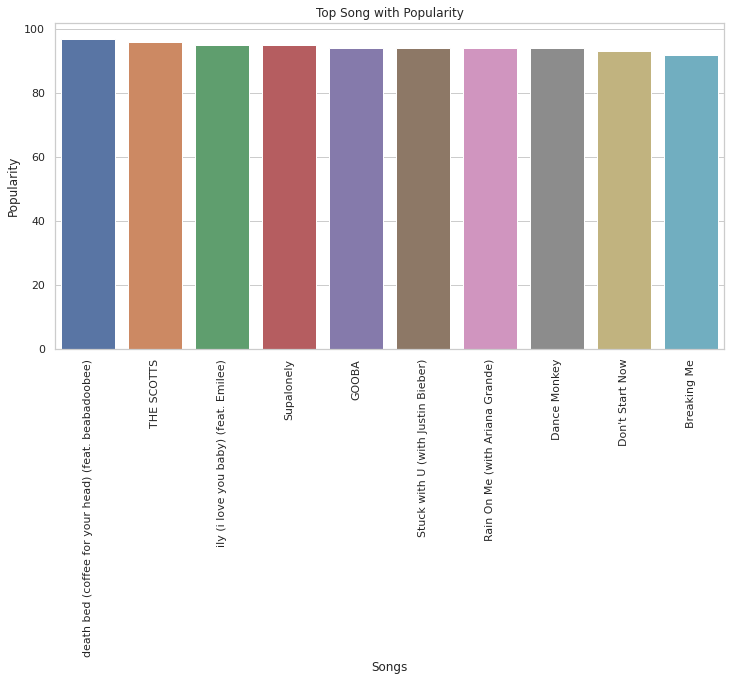

In [ ]:
plt.figure(figsize=(12,6))
sns.set(style="whitegrid")
x = music.groupby("name")["popularity"].mean().sort_values(ascending=False).head(10)
ax = sns.barplot(x.index, x)
ax.set_title('Top Song with Popularity')
ax.set_ylabel('Popularity')
ax.set_xlabel('Songs')
plt.xticks(rotation = 90)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 <a list of 10 Text major ticklabel objects>)

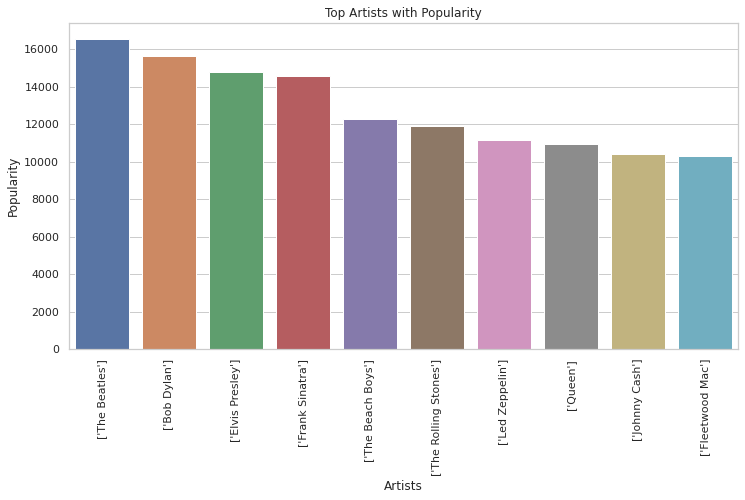

In [ ]:
plt.figure(figsize=(12,6))
sns.set(style="whitegrid")
x = music.groupby("artists")["popularity"].sum().sort_values(ascending=False).head(10)
ax = sns.barplot(x.index, x)
ax.set_title('Top Artists with Popularity')
ax.set_ylabel('Popularity')
ax.set_xlabel('Artists')
plt.xticks(rotation = 90)

top 10 artists in terms of average energy per song and compare the results with their average acousticness values.

In [ ]:
music[['artists','energy','acousticness']].groupby('artists').mean().sort_values(by='energy', ascending=False)[:10]

,energy,acousticness
artists,,
['Ocean Sounds ACE'],1.000000,0.629000
['Darkthrone'],0.999500,0.008002
['Nature Sounds Nature Music'],0.999333,0.640000
['Lluvia PQ'],0.999000,0.123000
['Tranquility Spree'],0.999000,0.112000
['Thunderbound Productions'],0.999000,0.954000
['Swell Maps'],0.999000,0.000298
['The Relaxing Sounds of Swedish Nature'],0.999000,0.508000
['Caramella Girls'],0.998500,0.028700


**Widgets(A dropdown) for popular songs of every year**

Using these widgets, it is possible to choose a year from the list of years 1920-2020 and find the most popular song of that year

Dropdown(options=('ALL', 1921, 1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933, 1934, 1…

                                  name  popularity
78168                            Carve          10
78213  Primera Ilusión - Remasterizado           0
78219                          L'enfer           0
78218      Cachonguita - Remasterizado           0
78217    De Mil Amores - Remasterizado           0


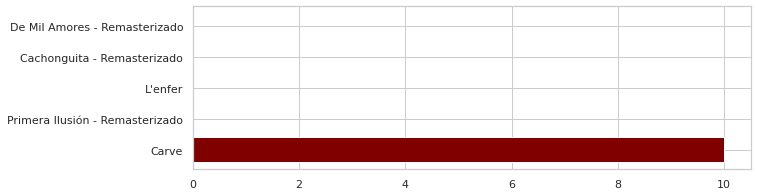

                                                    name  popularity
89675                                 In the Mood - Live          51
79841                                 Moonlight Serenade          50
79842                                        In the Mood          49
79843                              Chattanooga Choo Choo          43
79848  Follow The Yellow Brick Road / You're Off To S...          40


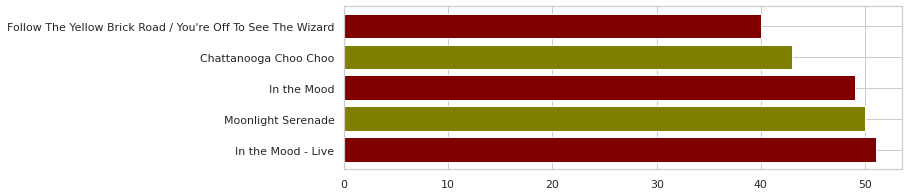

                                                    name  popularity
79740                                  Wabash Cannonball          40
79741                                    Tennessee Waltz          37
79744                  Clarinet a la King - Instrumental          31
79745                             All The Things You Are          21
79747  More Than You Know (with Teddy Wilson & His Or...          19


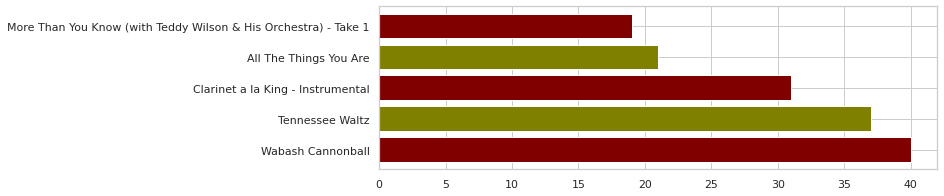

                                          name  popularity
78340  Mississippi Mud (feat. Bix Beiderbecke)          13
78341                   In My Merry Oldsmobile          11
78342                                  Changes           7
78343                                   Sunday           6
78344                               Slow River           6


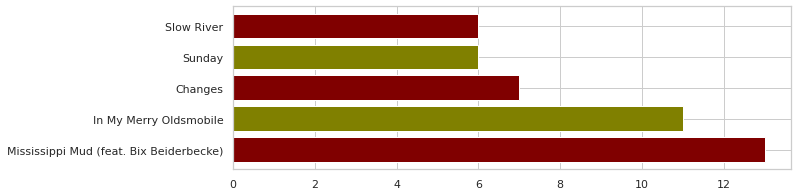

In [ ]:
import ipywidgets as widgets
all = 'ALL'
def unique_sorted_values(array):
  distinct = array.unique().tolist()
  distinct=sorted(distinct)
  distinct.insert(0,all)
  return distinct

year = widgets.Dropdown(options= unique_sorted_values(music['year']))

def condition(change):
    if (change.new == all):
      df=music.sort_values('popularity',ascending = False)[['name','popularity']][0:5]
      print(df)
      plt.figure(figsize=(10,3))
      plt.barh(df['name'], df['popularity'],color=('cyan','blue'))
      plt.show()


    else:
      df=music[music['year'] == change.new]
      df=df.sort_values('popularity',ascending = False)[['name','popularity']][0:5]
      print(df)
      plt.figure(figsize=(10,3))
      plt.barh(df['name'], df['popularity'],color=('maroon','olive'))
      plt.show()



year.observe(condition, names ='value')
display(year)

Widgets(a dropdown) for getting top 5 most acoustic/instrumental, happy,longest songs etc.

Dropdown(options=('acousticness', 'danceability', 'valence', 'loudness', 'energy', 'duration_ms'), value='acou…

                                                    name  energy
79825  Applause; Benny Goodman's 'No Encore' Announce...     1.0
12565                                      Dripping Rain     1.0
70358                                  Sleep: Soft Ocean     1.0
7242                Rain Forest and Tropical Beach Sound     1.0
39921                                    Ocean For Sleep     1.0


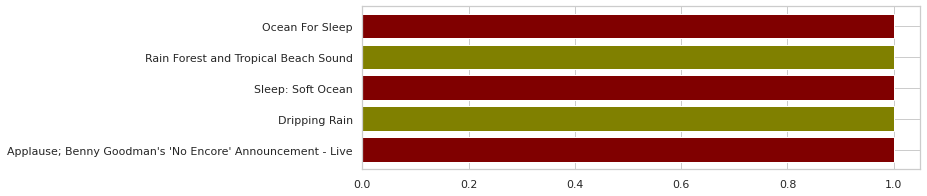

                                name  duration_ms
7411        Brown Noise - 90 Minutes      5403500
46972          Brown Noise for Sleep      4270034
54511   Midnight Thunderstorm Part 2      4269407
125152         Ocean Waves for Sleep      4120258
54675             Ocean Waves Sounds      4120258


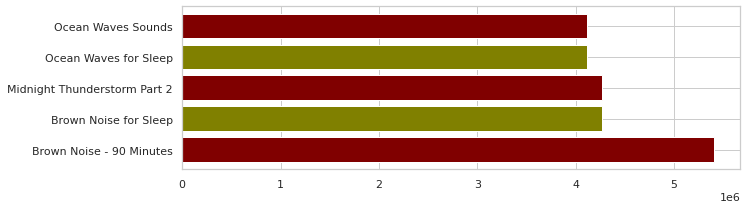

                                                     name  loudness
108249                                               Sold     3.855
156745  Your Pretty Face Is Going to Hell - Alternate ...     3.744
161927                                              Idiot     2.799
35448                           Death Trip - Iggy Pop Mix     1.963
127898                                               drag     1.830


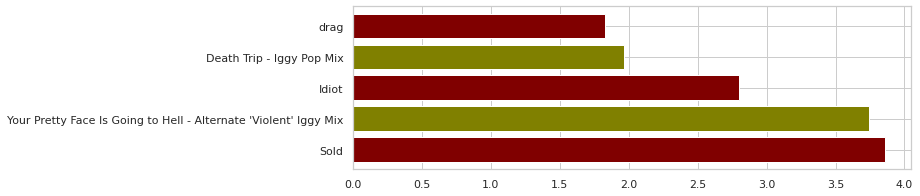

                          name  valence
133721      Pasito Duranguense    1.000
159911            Electric Zoo    1.000
108428                 Chatter    1.000
103015  Les Petites Marionttes    0.999
6061         Barney Theme Song    0.998


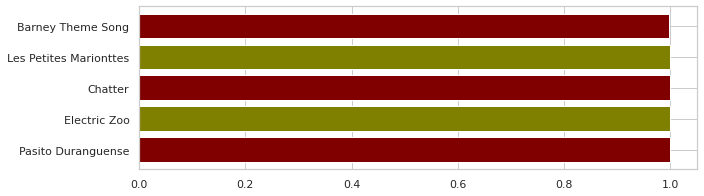

In [ ]:
import ipywidgets as widgets

lst = ['acousticness', 'danceability', 'valence', 'loudness', 'energy','duration_ms']

factors = widgets.Dropdown(options = lst)

def condition(change):
  for i in range(len(lst)):
    if (change.new == lst[i]):
      df=music.sort_values(lst[i],ascending = False)[['name',lst[i]]][0:5]
      print(df)
      plt.figure(figsize=(10,3))
      plt.barh(df['name'], df[lst[i]],color=('maroon','olive'))
      plt.show()

factors.observe(condition, names ='value')
display(factors)

Popularity throughout the decades : is popularity affected by type of content(explicit/implicit) ?

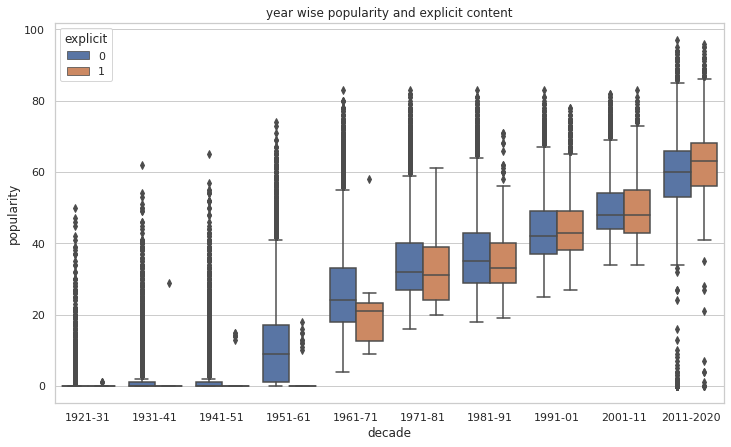

In [ ]:
plt.figure(figsize=(12,7))
sns.boxplot(x='decade',y='popularity',hue = 'explicit',data=music)
plt.title('year wise popularity and explicit content')
plt.show()

There was very less explicit content before 1960s. Songs mostly started having explicit contents since 1970s. Songs having explicit content were in general, less popular than those that did not have explicit content. In the recent decade, we can see that songs having explicit content are more popular than those that do not have explicit content. This also shows the change of culture through the decade.

Also, it is important to note that popularity increased over years because in this dataset, it is a metric which is measured on the basis of how many times the song is played. Due to this, older songs have less populariy.

To check if popularity is affected by mode

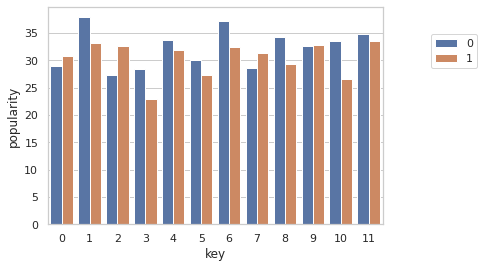

In [ ]:
sns.barplot(x='key', y = 'popularity', hue='mode', data=music,ci=None)
plt.legend(loc='best', bbox_to_anchor=(0.8, 0., 0.5, 0.9))
plt.show()

A combination of mode 0 and key 1 is more likely to get ur song popular.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning

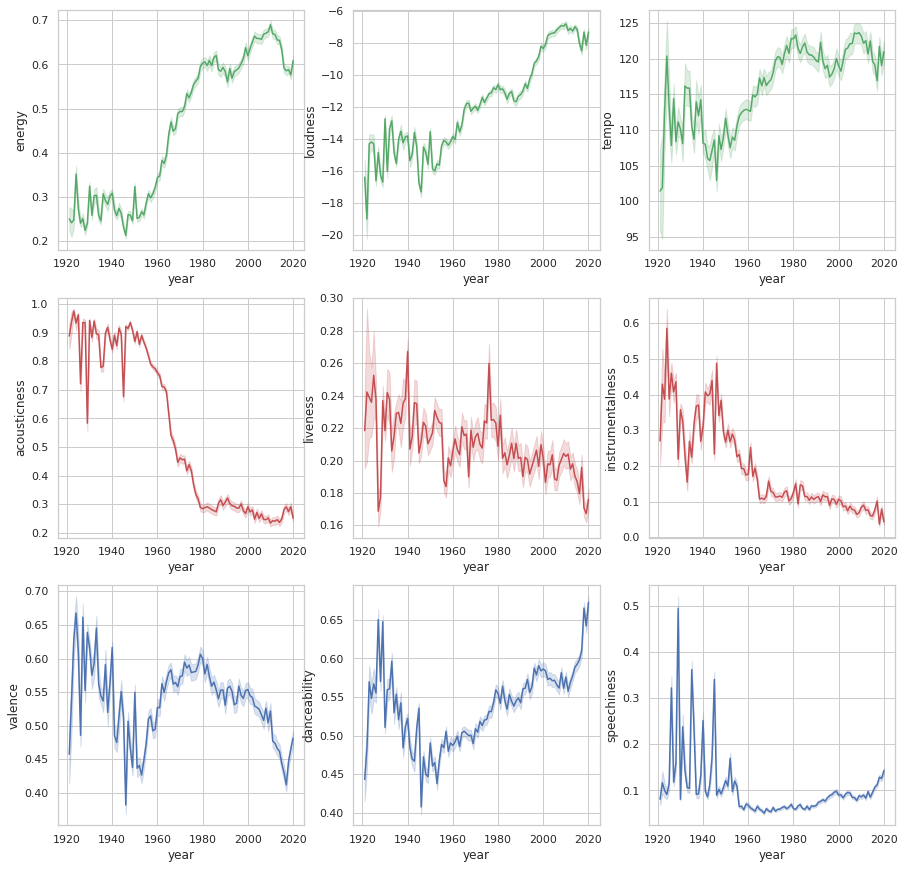

In [ ]:
fig , axes = plt.subplots(3,3,figsize=(15,15))
sns.lineplot(music['year'],music['energy'],color='g',ax=axes[0,0])
sns.lineplot(music['year'],music['loudness'],color='g',ax=axes[0,1])
sns.lineplot(music['year'],music['tempo'],color='g',ax=axes[0,2])
sns.lineplot(music['year'],music['acousticness'],color='r',ax=axes[1,0])
sns.lineplot(music['year'],music['liveness'],color='r',ax=axes[1,1])
sns.lineplot(music['year'],music['instrumentalness'],color='r',ax=axes[1,2])
sns.lineplot(music['year'],music['valence'],color='b',ax=axes[2,0])
sns.lineplot(music['year'],music['danceability'],color='b',ax=axes[2,1])
sns.lineplot(music['year'],music['speechiness'],color='b',ax=axes[2,2])
plt.show()

> Let's observe what happens over time for each variable. To do this, we will need a single statistic representing each variable per year. This is because there are multiple variables for each year per column (e.g., many songs contain varying acousticness per year). Intuitively, we can use the average for each metric we are observing. One final note to take into consideration is the fact that multiple columns are already normalized between 0-1. Popularity and Loudness will need to be normalized

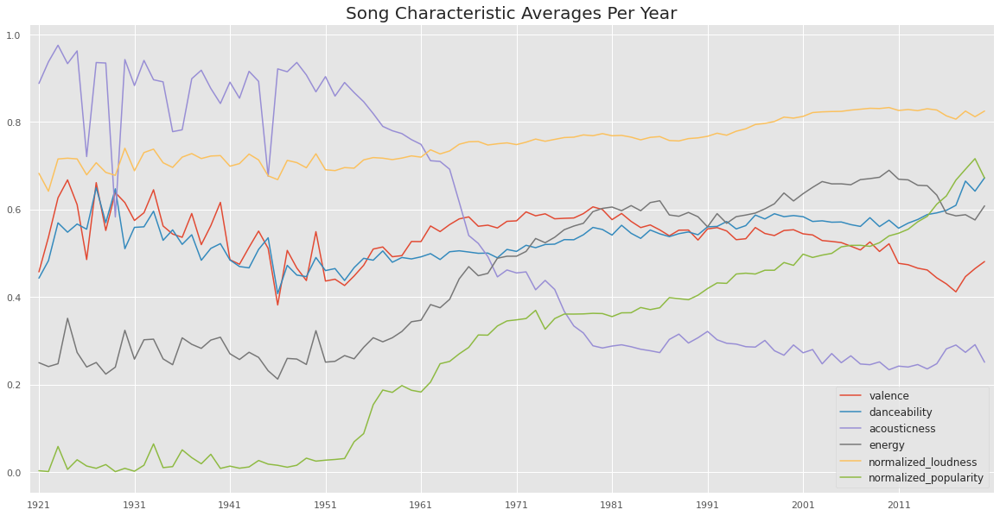

In [ ]:
with plt.style.context('ggplot'):
    f_to_normalize = ['loudness', 'popularity']

    # First apply normalization
    for f in f_to_normalize:
        music[f'normalized_{f}'] = (music[f] - music[f].min()) / (music[f].max() - music[f].min())

    features = ['valence', 'danceability', 'acousticness', 'energy', 'normalized_loudness', 'normalized_popularity']

    # Group by year, take the average
    music_by_year_average = music.groupby('year').mean()

    # Plot line chart
    fig = plt.figure(figsize=(20,10))

    for f in features:
        plt.plot(music_by_year_average.index,
                music_by_year_average[f],
                label=f)

    plt.xticks(np.arange(music_by_year_average.index.min(), music_by_year_average.index.max() + 2, 10))
    plt.title('Song Characteristic Averages Per Year', fontsize=20)
    plt.legend(fontsize=12)
    plt.margins(x=.01);

- There are a couple things to note:
    1. Acousticness begins to dip and ultimately stays low after 1951. Could this be explained by developing recording technology being able to catpure live performances?
    2. Both energy and popularity begin to increase over time after around 1951. In terms of popularity, this could suggest that people who are currently using the Spotify app prefer songs from 1950s and after.
    3. Although there are multiple dramatic dips in the other features, they mostly stay steady over time.
- Here are a couple things to consider that might've affected these values:
    1. Rock n roll was raging during the mid-late 1950s
    2. The electric guitar was starting to establish its presence, with Elvis Presley releasing his first single, "That's All Right"
    3. In 1949, the 45 rpm record was born
    4. Rhythm & Blues started to become popular around this time as well, including many other genres!
    5. Bob Dylan (folk to electric guitar)

Let's try observing the interval of time between 1950-1980

In [ ]:
# filter data between 1950-1980
music_filtered_years = music[(music['year'] >= 1950) & (music['year'] <= 1980)]



In [ ]:
music_filtered_years.head()

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,...,name,popularity,release_date,speechiness,tempo,valence,year,decade,normalized_loudness,normalized_popularity
1054,0.782,['Эрнест Хемингуэй'],0.633,106471,0.2610,1,0paY0vLrn5ZZ26F8JzkEKQ,0.0000,1,0.235,...,"Часть 1.4 & Часть 2.1 - За рекой, в тени деревьев",0,1950,0.7970,167.679,0.655,1950,1941-51,0.682969,0.0
1055,0.988,"['Ottorino Respighi', 'London Symphony Orchest...",0.420,232933,0.0909,0,0pdgc1WRsbipUSUOMqwxO4,0.7860,10,0.104,...,"La boutique fantasque, P. 120 (after Rossini):...",0,1950-01-01,0.0409,123.089,0.227,1950,1941-51,0.636003,0.0
1056,0.993,['Balbir'],0.394,177981,0.2580,0,0phryp8fqKsVxj3HBRV4oH,0.0770,5,0.153,...,Bhagwan Tere Zulm Ki,0,1950-12-31,0.1100,74.761,0.340,1950,1941-51,0.786485,0.0
1057,0.730,['Эрнест Хемингуэй'],0.618,125300,0.2720,1,0piKd4tMSBAXQ0T5oOaJkb,0.0000,6,0.146,...,"Часть 85.2 - За рекой, в тени деревьев",0,1950,0.7310,67.141,0.449,1950,1941-51,0.649675,0.0
1058,0.993,['Stauros Tzouanakos'],0.475,188600,0.4070,0,0piXlJRM4ai5VeUeLkT9Sk,0.0134,9,0.116,...,To parasito,0,1950-01-01,0.0492,74.130,0.594,1950,1941-51,0.735870,0.0


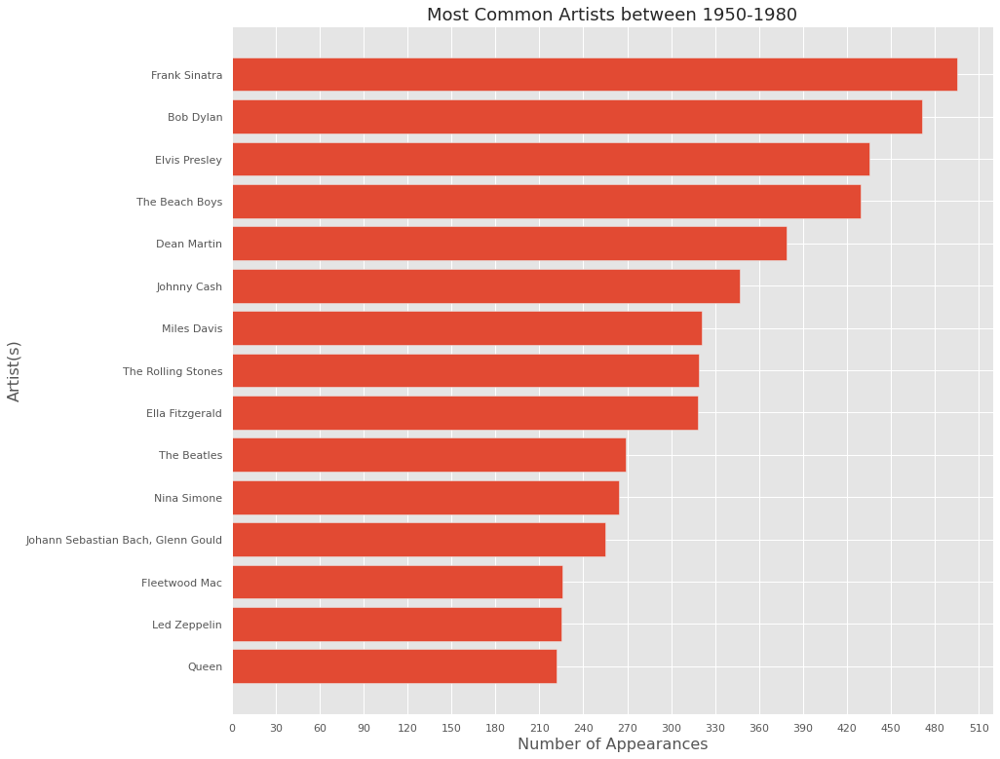

In [ ]:
import numpy as np
import re

RANGE = 15
FONTSIZE_1 = 18
FONTSIZE_2 = 16

# Limit to top artists
top_artists = music_filtered_years['artists'].value_counts().index[:RANGE]
top_artists_cleaned = [re.sub('[\[\]\'\']', '', str(artist)) for artist in top_artists] # clean labels

top_artists_frequencies = music_filtered_years['artists'].value_counts()[:RANGE]

with plt.style.context('ggplot'):
    fig = plt.figure(figsize=(14, 13))
    
    plt.title('Most Common Artists between 1950-1980',
              fontsize=FONTSIZE_1)
    plt.xlabel('Number of Appearances',
               fontsize=FONTSIZE_2)
    plt.xticks(np.arange(0, 540, 30))
    
    plt.ylabel('Artist(s)',
               fontsize=FONTSIZE_2)

    plt.barh(top_artists_cleaned,
             top_artists_frequencies
            )
    plt.gca().invert_yaxis();

The most common artists during this time include the likes of Frank Sinatra, Elvis Presley, Bob Dylan, The Beatles, etc. These artists span genres including Jazz, Rock and Roll, Dream Pop. Additionally, these artists are still very popular even today (e.g., Fleetwod Mac - Dreams)
Let's observe the song feature averages from these artists to see if there are any similarities between them

In [ ]:
# Average features by artists
mfy_grouped = music_filtered_years.groupby('artists').mean()
target_artists = mfy_grouped.loc[top_artists]
target_artists

,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,valence,year,normalized_loudness,normalized_popularity
['Frank Sinatra'],0.713163,0.377871,188194.000000,0.235806,0.000000,0.004152,5.191919,0.215801,-14.346947,0.759596,25.890909,0.049993,109.247079,0.366486,1961.541414,0.714949,0.266917
['Bob Dylan'],0.573834,0.510619,253071.016985,0.483101,0.000000,0.036735,5.199575,0.319870,-10.981015,0.902335,29.895966,0.067122,126.612499,0.562894,1968.607219,0.767661,0.308206
['Elvis Presley'],0.753707,0.495343,155203.314943,0.415424,0.000000,0.057018,4.268966,0.245713,-13.207253,0.912644,31.774713,0.057014,112.067497,0.619729,1964.508046,0.732797,0.327574
['The Beach Boys'],0.394508,0.505562,147364.988345,0.530684,0.000000,0.127432,6.158508,0.199263,-9.950807,0.857809,27.179487,0.043302,126.287513,0.631823,1965.773893,0.783794,0.280201
['Dean Martin'],0.868971,0.464722,161177.546174,0.219675,0.000000,0.024949,5.205805,0.180536,-14.526135,0.778364,18.126649,0.041976,111.214501,0.473549,1958.160950,0.712143,0.186873
['Johnny Cash'],0.702055,0.619905,156006.772334,0.446618,0.000000,0.022028,5.907781,0.245396,-11.764902,0.902017,22.331412,0.114440,115.336893,0.691199,1963.786744,0.755385,0.230221
['Miles Davis'],0.656875,0.447967,394603.691589,0.304124,0.000000,0.221526,4.666667,0.225763,-14.814583,0.461059,22.414330,0.056900,113.888583,0.413370,1960.062305,0.707625,0.231076
['The Rolling Stones'],0.295783,0.516592,230335.551724,0.719925,0.006270,0.171025,4.727273,0.266580,-7.872006,0.890282,32.821317,0.052097,123.700661,0.654835,1969.457680,0.816349,0.338364
['Ella Fitzgerald'],0.824692,0.419289,206158.559748,0.248747,0.000000,0.001128,5.418239,0.206322,-12.837255,0.720126,19.811321,0.055290,108.420198,0.387355,1958.201258,0.738591,0.204240
['The Beatles'],0.375361,0.524364,171895.371747,0.528513,0.000000,0.060158,4.524164,0.224547,-10.160134,0.814126,49.925651,0.054364,120.323599,0.611682,1966.739777,0.780516,0.514697


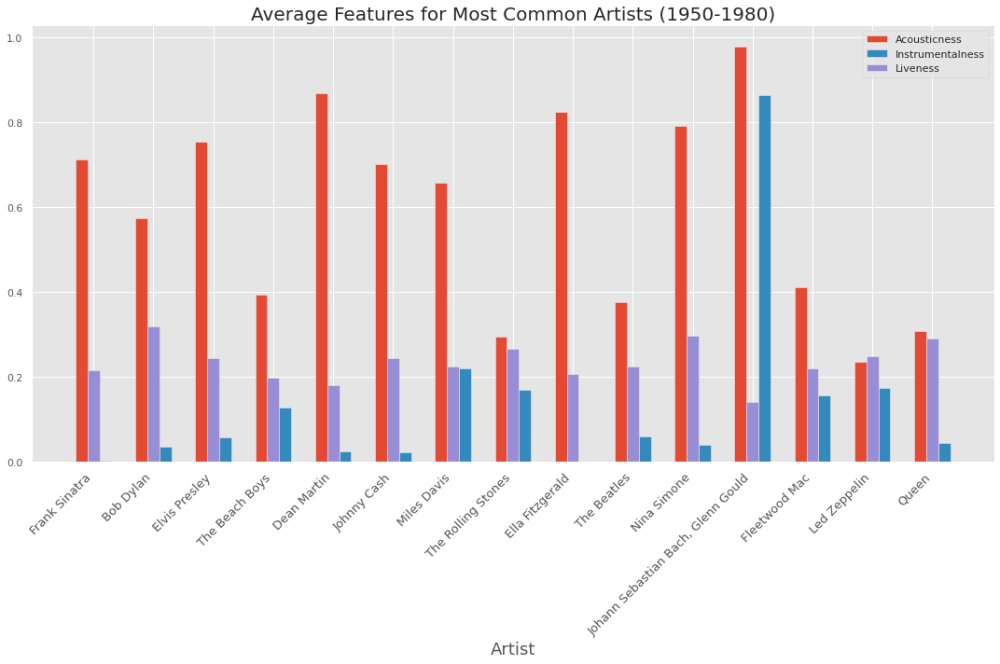

In [ ]:
with plt.style.context('ggplot'):
    FONTSIZE_1 = 20
    FONTSIZE_2 = 18
    FONTSIZE_3 = 13
    
    x = np.arange(len(top_artists_cleaned))  # the label locations
    y1 = target_artists['acousticness']
    y2 = target_artists['instrumentalness']
    y3 = target_artists['liveness']

    width = 0.60  # the width of the bars
    rect_width = width / 3
    position = rect_width

    fig, ax = plt.subplots(figsize=(15, 10))
    # Plot Group of 3 bars, one by one
    rects1 = ax.bar(x - position, y1, width /3, label='Acousticness')
    rects2 = ax.bar(x + position, y2, width /3, label='Instrumentalness')
    rects3 = ax.bar(x, y3, width/3, label='Liveness')



    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_xticks(range(len(top_artists)))
    ax.set_xticklabels(top_artists_cleaned, rotation=45, ha='right', fontsize=FONTSIZE_3)
    ax.set_xlabel('Artist', fontsize=FONTSIZE_2)
    ax.set_title('Average Features for Most Common Artists (1950-1980)', fontsize=FONTSIZE_1)
    ax.legend()

    # ax.bar_label(rects1, padding=3)
    # ax.bar_label(rects2, padding=3)

    fig.tight_layout()

    plt.show()


**Multivariate Analysis**

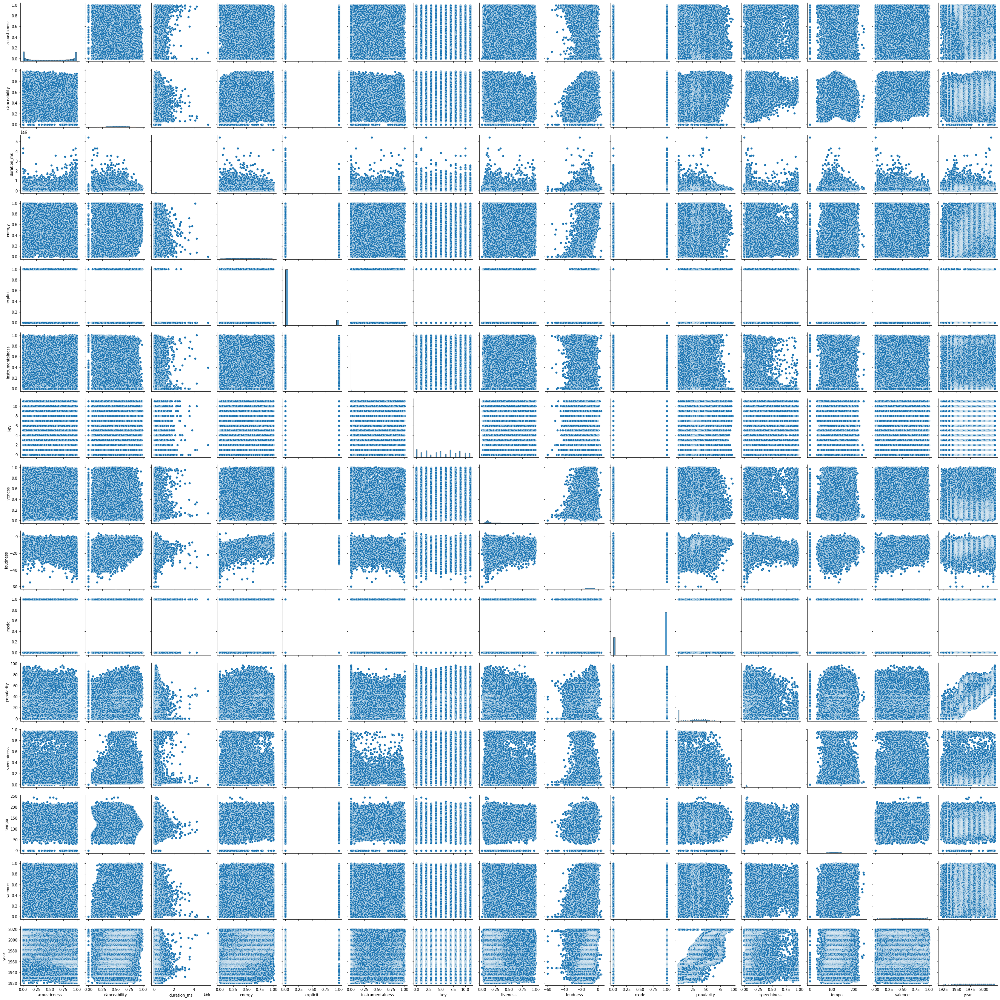

In [ ]:
#music = sns.load_dataset("/content/drive/MyDrive/Colab Notebooks/spotify.csv")
sns.pairplot(music)

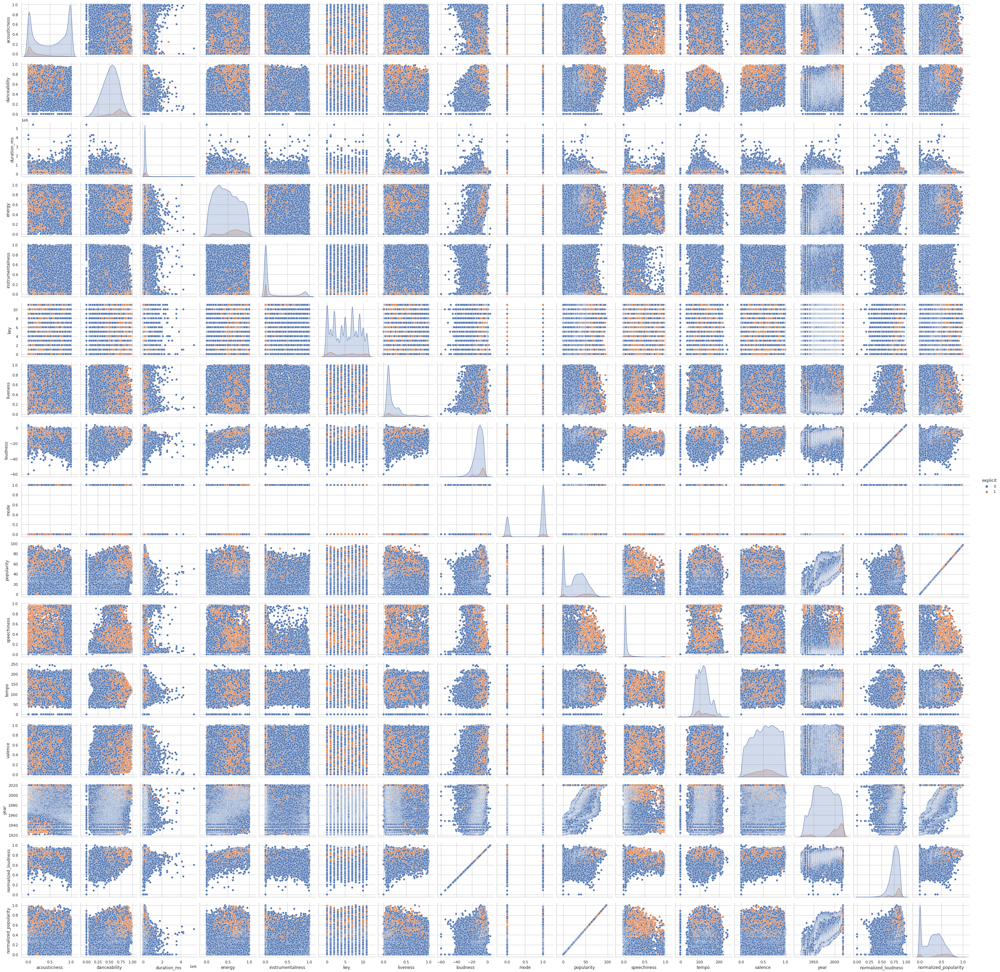

In [ ]:
sns.pairplot(music,hue = 'explicit')
plt.show()

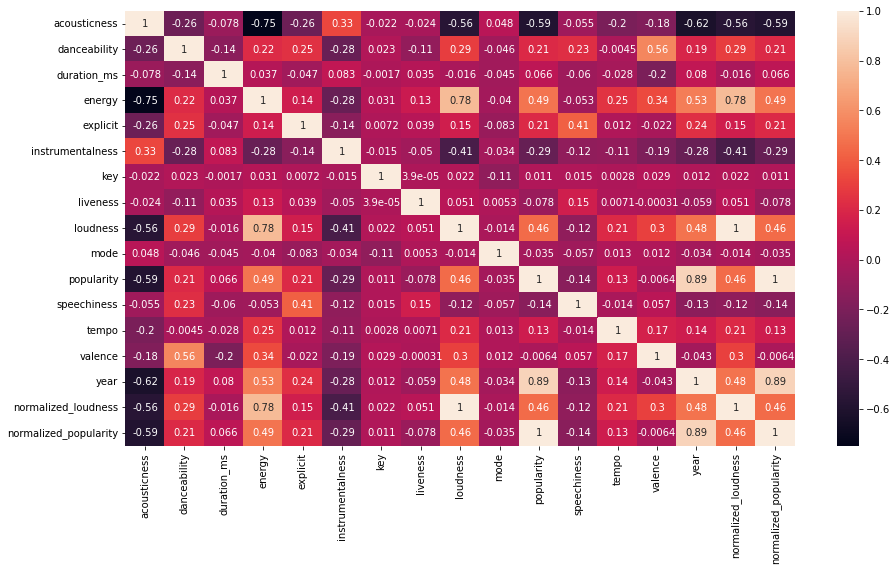

In [ ]:
plt.figure(figsize = (15,8))
sns.heatmap(music.corr(),annot = True)
plt.show()

In [ ]:
music.corr()

,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,valence,year
acousticness,1.000000,-0.262456,-0.078190,-0.747438,-0.256961,0.328865,-0.022233,-0.023526,-0.561781,0.048380,-0.588654,-0.055407,-0.204868,-0.177028,-0.619240
danceability,-0.262456,1.000000,-0.135057,0.215910,0.246059,-0.278631,0.023093,-0.105063,0.290127,-0.046248,0.212250,0.229487,-0.004502,0.558774,0.194340
duration_ms,-0.078190,-0.135057,1.000000,0.036531,-0.046983,0.083255,-0.001693,0.035093,-0.015753,-0.044907,0.066044,-0.059630,-0.027563,-0.197492,0.079701
energy,-0.747438,0.215910,0.036531,1.000000,0.140000,-0.280481,0.030921,0.126223,0.781291,-0.039953,0.492356,-0.052909,0.249378,0.343751,0.526638
explicit,-0.256961,0.246059,-0.046983,0.140000,1.000000,-0.141001,0.007156,0.039018,0.148702,-0.082724,0.214414,0.414800,0.012375,-0.022033,0.241780
instrumentalness,0.328865,-0.278631,0.083255,-0.280481,-0.141001,1.000000,-0.015134,-0.049820,-0.407933,-0.034334,-0.285700,-0.119072,-0.105331,-0.187822,-0.278362
key,-0.022233,0.023093,-0.001693,0.030921,0.007156,-0.015134,1.000000,0.000039,0.022406,-0.114131,0.011482,0.014769,0.002807,0.029277,0.012281
liveness,-0.023526,-0.105063,0.035093,0.126223,0.039018,-0.049820,0.000039,1.000000,0.051007,0.005317,-0.077817,0.149393,0.007147,-0.000314,-0.059313
loudness,-0.561781,0.290127,-0.015753,0.781291,0.148702,-0.407933,0.022406,0.051007,1.000000,-0.013563,0.459286,-0.115517,0.210971,0.304917,0.481935
mode,0.048380,-0.046248,-0.044907,-0.039953,-0.082724,-0.034334,-0.114131,0.005317,-0.013563,1.000000,-0.035359,-0.057175,0.013156,0.012295,-0.034011


**Notes:** 
1. Valence has a moderate correlation of .56 with danceability
3. Acousticness has a high correlation of -0.75 with energy
4. Loudness has a high correlation of .79 with energy
4. Popularity has a moderate correlation of -0.57 acousticness
5. The rest of the features have a Very-low/Low correlation to other features.



There is a positive correlation between valence and danceability, loudness and energy, popularity and year, popularity and energy. but there seems to be a strong negative correlation between energy and acousticness, popularity and acousticness.

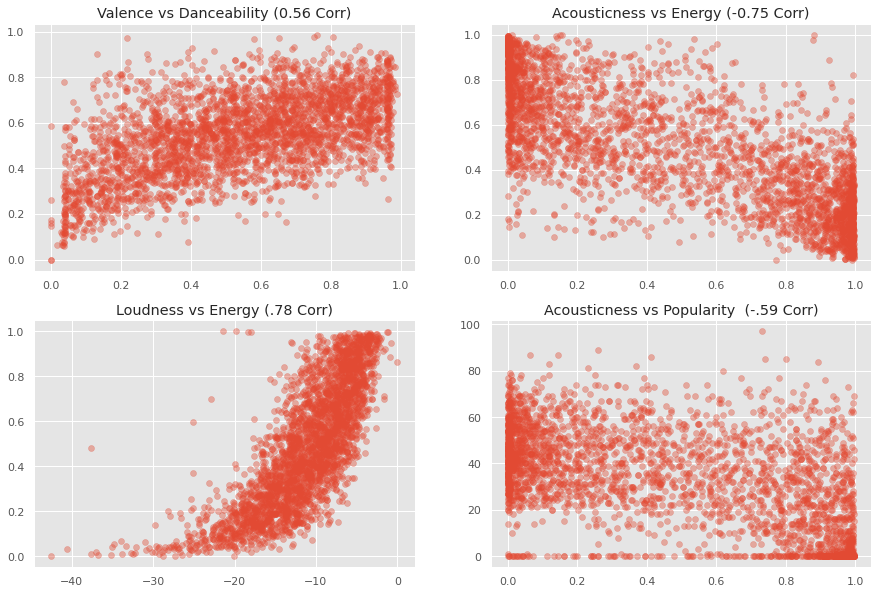

In [ ]:
# limit overplotting
limit = 3000
a=.40
sample = music.sample(limit)

with plt.style.context('ggplot'):
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))

    ax1.set_title('Valence vs Danceability (0.56 Corr)')
    ax1.scatter(sample['valence'][:limit], sample['danceability'][:limit], alpha=a)

    ax2.set_title('Acousticness vs Energy (-0.75 Corr)')
    ax2.scatter(sample['acousticness'][:limit], sample['energy'][:limit], alpha=a)

    ax3.set_title('Loudness vs Energy (.78 Corr)')
    ax3.scatter(sample['loudness'][:limit], sample['energy'][:limit], alpha=a)

    ax4.set_title('Acousticness vs Popularity  (-.59 Corr)')
    ax4.scatter(sample['acousticness'][:limit], sample['popularity'][:limit], alpha=a)

   

    plt.show()

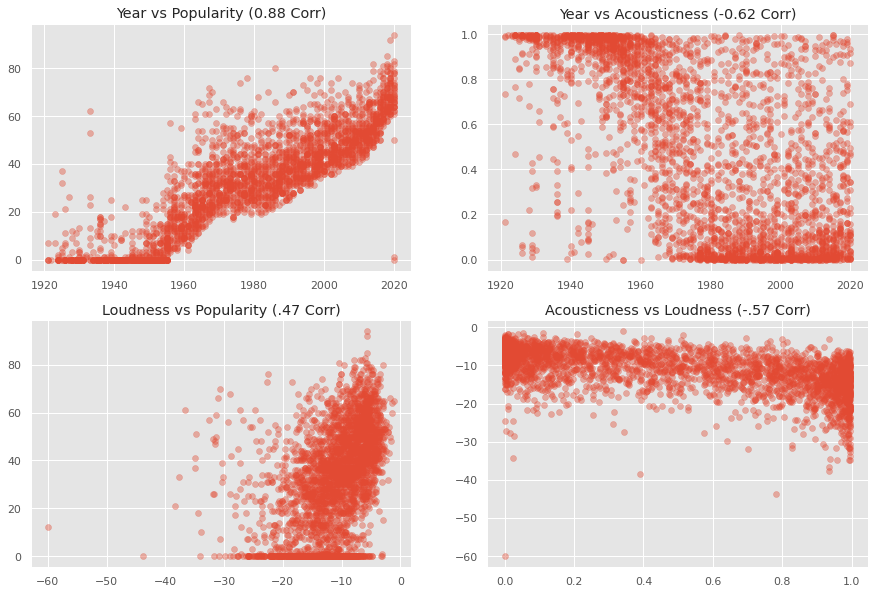

In [ ]:
# limit overplotting
limit = 3000
a=.40
sample = music.sample(limit)

with plt.style.context('ggplot'):
    fig, ((ax5, ax6), (ax7, ax8)) = plt.subplots(2, 2, figsize=(15, 10))

    ax5.set_title('Year vs Popularity (0.88 Corr)')
    ax5.scatter(sample['year'][:limit], sample['popularity'][:limit], alpha=a)

    ax6.set_title('Year vs Acousticness (-0.62 Corr)')
    ax6.scatter(sample['year'][:limit], sample['acousticness'][:limit], alpha=a)

    ax7.set_title('Loudness vs Popularity (.47 Corr)')
    ax7.scatter(sample['loudness'][:limit], sample['popularity'][:limit], alpha=a)

    ax8.set_title('Acousticness vs Loudness (-.57 Corr)')
    ax8.scatter(sample['acousticness'][:limit], sample['loudness'][:limit], alpha=a)

   

    plt.show()

> Popularity vs Acousticness's correlation appears to be from a dense set of variables in the upper left corner and the bottom-middle area of the chart. The chart overall appears to be more random in nature than implied by the correlation.

> The other 3 charts have a good visual correlation with loudness vs energy displaying a sort of exponential/logarithmic relationship.
